In [1]:
import numpy as np
import xarray as xr

# No X-window
import matplotlib
# matplotlib.use('Agg')

import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import matplotlib.cm as cmx
from os.path import join
from netCDF4 import Dataset # pylint: disable=no-name-in-module
import h5py
import cftime
import cmocean
from matplotlib.path import Path
from MyLib import hist2plot
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

import warnings
warnings.filterwarnings('ignore')

In [4]:
# data_dir = "E:/ALPLakes/Codes/Ctracker/config_for_cscs/PT1_backward_east/"
# fname = "PT1_backward_3depths"
# data_dir = "G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT_secchi_low/PT9_backward_east/"
# fname = "PT9_backward_3depths"
# data_dir = "G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT_secchi_low/PT3_backward_west1/"
# fname = "PT3_backward_4depths"
data_dir = "G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT2_backward_center/"
fname = "PT2_backward_3depths"

# data_dir = "G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT14_forward_deepwater/"
# fname = "PT14_100_4depths_6"
# fname = "PT_test"
# data_dir = "E:/ALPLakes/Codes/Ctracker/config_for_cscs/PT3_backward_west/"
# fname = "PT3_backward_3depths"
data_file = join(data_dir, "%s_run.nc" % fname)
inout_file = join(data_dir, "%s_inout.nc" % fname)

In [5]:
data_file

'G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT2_backward_center/PT2_backward_3depths_run.nc'

In [6]:
Dataset(data_file).variables.keys()

odict_keys(['k_p1', 'j_g', 'i_g', 'k', 'j', 'k_u', 'i', 'k_l', 'XC', 'YC', 'XG', 'YG', 'Zl', 'Zu', 'Z', 'Zp1', 'dxC', 'rAs', 'rAw', 'Depth', 'rA', 'dxG', 'dyG', 'rAz', 'dyC', 'PHrefC', 'drC', 'PHrefF', 'drF', 'hFacS', 'hFacC', 'hFacW', 'maskW', 'maskC', 'maskS', 'dxF', 'dyU', 'dyF', 'rhoRef', 'dxV', 'i_p1', 'j_p1', 'XG_p1', 'YG_p1', 'pid', 'time', 'itrack', 'jtrack', 'ktrack', 'xtrack', 'ytrack', 'ztrack'])

In [7]:
Dataset(data_file).variables['ztrack'].shape

(150000, 153)

(0.0, 10.0)

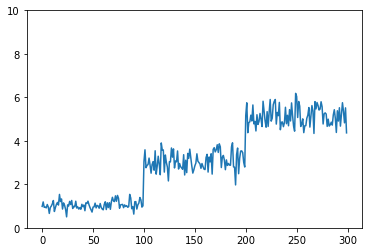

In [8]:
plt.plot(Dataset(data_file).variables['ztrack'][::500,0])
plt.ylim([0,10])

In [9]:
# open without chunks otherwise loading takes forever
data = xr.open_dataset(data_file, decode_times=True)
inout = xr.open_dataset(inout_file, decode_times=True)

In [10]:
time = data.time
xG = data.XG_p1
yG = data.YG_p1
xC = data.XC
yC = data.YC
bathy = data.Depth.to_masked_array()

# ie = int(inout.i_ende)
# xend = xC[:, ie]
# xend = xend[bathy[:, ie] != 0]
# yend = yC[:, ie]
# yend = yend[bathy[:, ie] != 0]

In [11]:
(X0, Y0) = (500000, 116500)
(X1, Y1) = (563000, 138700)
gridAngle = np.arctan2(Y1-Y0, X1-X0)

x_com = np.array(xG[0, :])
y_com = np.array(yG[:, 0])
xx_com,yy_com = np.meshgrid(x_com,y_com)

xG_conv = (np.cos(gridAngle)*xx_com - np.sin(gridAngle)*yy_com) + X0
yG_conv = (np.sin(gridAngle)*xx_com + np.cos(gridAngle)*yy_com) + Y0


In [12]:
# xs, ys = np.genfromtxt("E:/ALPLakes/algal_bloom_Sep2021/Codes/geometery/shoreline_Leman.ldb",unpack=True)
xs, ys = np.genfromtxt("I:/shoreline_Leman.ldb",unpack=True)
xs *= 1.e-3
ys *= 1.e-3

# Depth selection

In [23]:
# realease depth which will be plotted
z0 = [1,3]
zdata = []
for zz in z0:
    sel_pid = inout.pid.where(inout.z_ini==zz, drop=True)
    zd = data.sel(pid=sel_pid, drop=True)
    zd.xtrack.load()
    zd.ytrack.load()
    zd.ztrack.load()
    zdata.append(zd)

# particle probability plot

In [24]:
no_pix_smooth = 6
xg_plt = xG.to_masked_array().filled()[::no_pix_smooth ,::no_pix_smooth ]
yg_plt = yG.to_masked_array().filled()[::no_pix_smooth ,::no_pix_smooth ]
font_feature = ['sans-serif', 16, 14] # [fontname, fontsize_labels, fontsize_ticks]
gridAngle = np.arctan2(Y1-Y0, X1-X0)
xp_conv = (np.cos(gridAngle)*xg_plt - np.sin(gridAngle)*yg_plt) + X0
yp_conv = (np.sin(gridAngle)*xg_plt + np.cos(gridAngle)*yg_plt) + Y0

xp_conv *= 1.e-3
yp_conv *= 1.e-3

In [9]:
# a_hist,b_hist = np.histogram(zp_orig, bins=np.arange(0,41,2))
# plt.hist(zp_orig, bins=np.arange(0,41,2))

### plots for the paper

In [25]:
# plt_path = 'G:/ALPLakes/algal_bloom_Sep2021/manuscript/plots/'
output_path = data_dir+'pt_probability_1to3_newplots/'

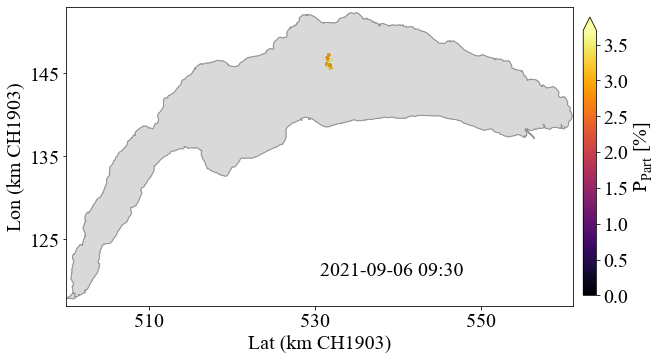

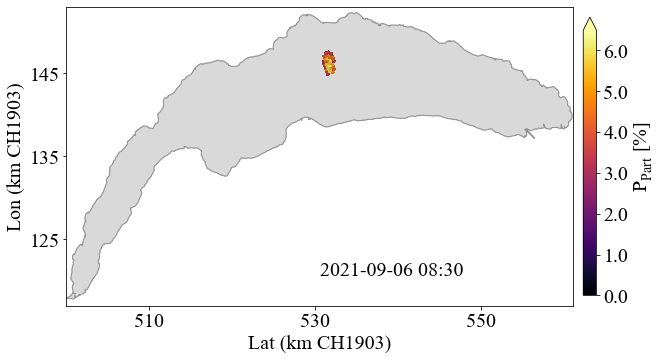

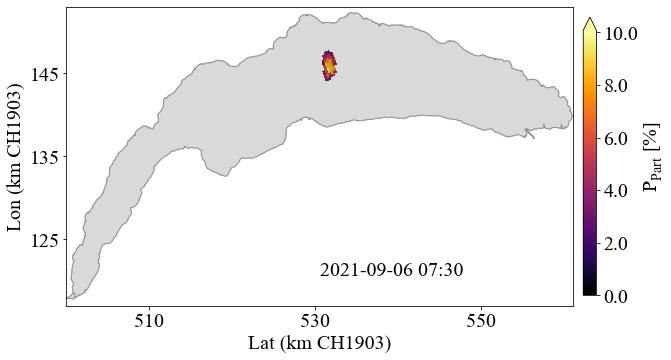

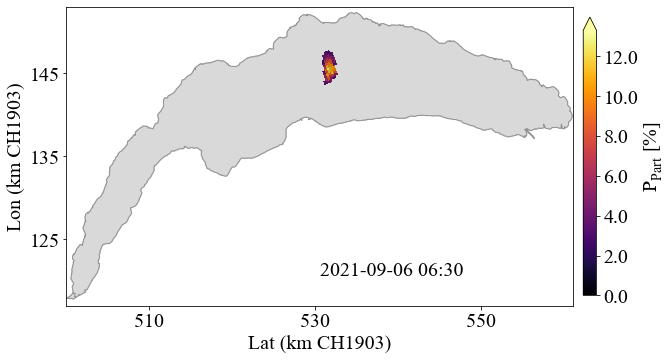

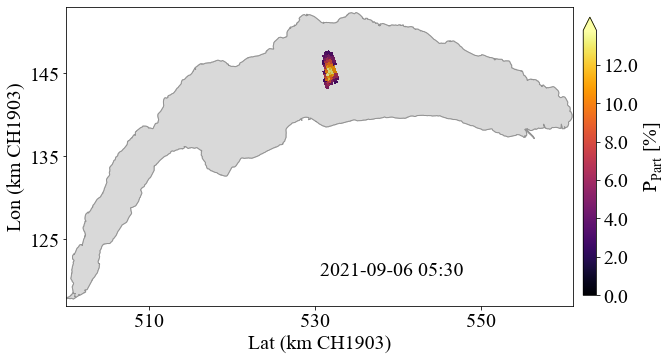

...

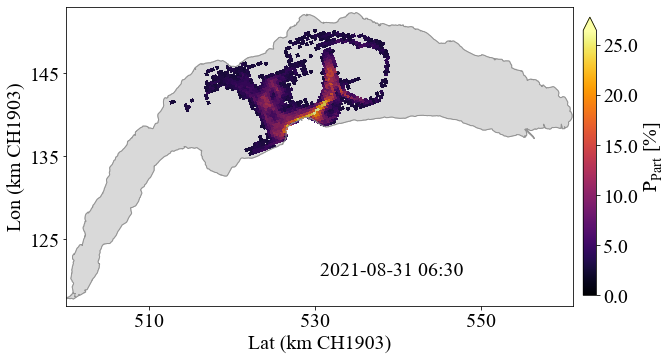

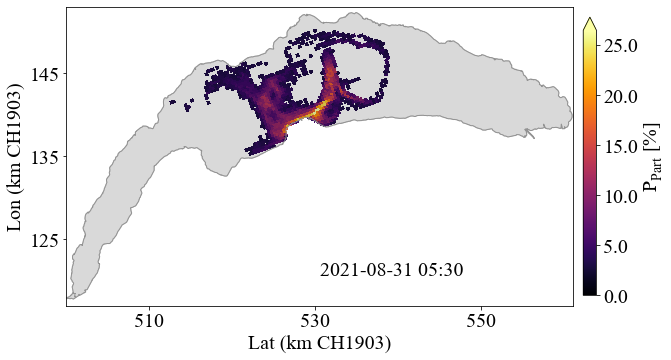

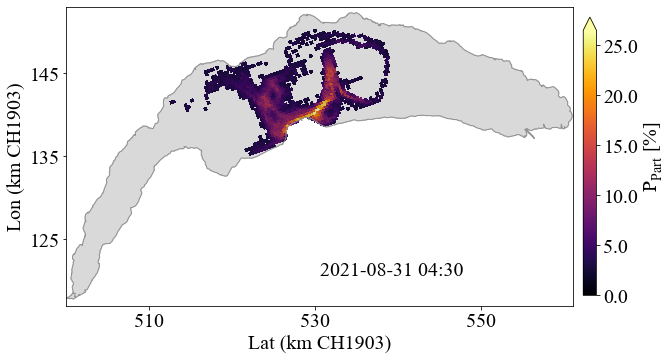

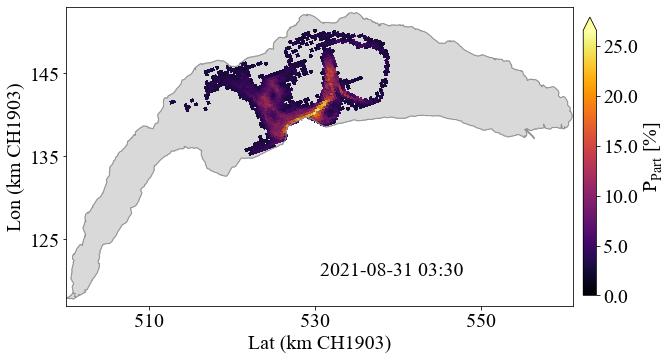

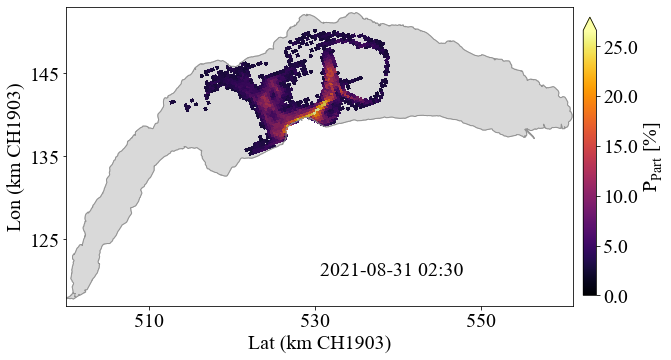

In [28]:
# initialization
qq = 1
###############
ii=1
tr = data.sel(pid=qq, drop=True)
time_plt = time.where(tr.itrack < 1e6, drop=True)
xp = np.array(tr.xtrack[:qq])
yp = np.array(tr.xtrack[:qq])
zp_orig = np.array(tr.ztrack[qq])
part_no_prob, _, _ = np.histogram2d(xp, yp, bins=[xg_plt[0,:],yg_plt[:,0]])
part_no_prob = part_no_prob.T
part_no_prob[:,:] = 0


for qq in (range(1,len(time))):
    ###############
    ii=1
    tr = data.sel(pid=qq, drop=True)
    time_plt = time.where(tr.itrack < 1e6, drop=True)
    xp = np.array(tr.xtrack[:qq])
    yp = np.array(tr.xtrack[:qq])
    zp_orig = np.array(tr.ztrack[qq])
    part_no_prob, _, _ = np.histogram2d(xp, yp, bins=[xg_plt[0,:],yg_plt[:,0]])
    part_no_prob = part_no_prob.T
    part_no_prob[:,:] = 0
    
    zp_orig = []
    # for ii in sel_pid[5::100]:
    for ii in sel_pid[0::50]:
        tr = data.sel(pid=ii, drop=True)
        xp = np.array(tr.xtrack[:qq])
        yp = np.array(tr.ytrack[:qq])
        zp = np.array(tr.ztrack[qq])
        zp_orig.append(np.atleast_1d(tr.ztrack[qq])[0])
        part_prob_dum, _, _ = np.histogram2d(xp, yp, bins=[xg_plt[0,:],yg_plt[:,0]])
        part_prob_dum = part_prob_dum.T
        part_prob_dum[part_prob_dum>0] = 1
        part_no_prob = part_no_prob+part_prob_dum
    # part_no_prob = 100*part_no_prob/len(sel_pid[5::100])
    part_no_prob = 100*part_no_prob/len(sel_pid[0::50])
    part_no_prob[part_no_prob<3] = np.nan # 2 for east and west; 3 for center
    
    ##############################
    fig_size = (9.5,6.6)
    font_feature = ['Times New Roman', 20, 20] # [fontname, fontsize_labels, fontsize_ticks]
    colormap = 'inferno'#cmocean.cm.oxy #cmocean.cm.thermal

    f = plt.figure(figsize=fig_size)

    ax = f.add_subplot(111)
    SS1 = plt.fill(xs,ys,color='k',alpha=0.15)
    plt.hold = True
    SS = plt.pcolormesh(xp_conv[:-1,:-1],yp_conv[:-1,:-1],part_no_prob, cmap=colormap,vmin=0, vmax=np.nanquantile(part_no_prob,.999),shading='flat',visible=True)
    ax.plot(xs,ys, color='#939393', lw=1.)

    plt.xticks(fontname=font_feature[0],fontsize=font_feature[2])
    plt.yticks(fontname=font_feature[0],fontsize=font_feature[2])

#     cbar = plt.colorbar(fraction=0.025,orientation="vertical",pad=-0.25,extend='max');
    cbar = plt.colorbar(fraction=0.025,pad=0.02,extend='max');
    cbar.ax.set_yticklabels(cbar.ax.get_yticks(),fontname=font_feature[0],fontsize=font_feature[2])
#     cbar = plt.colorbar(fraction=0.025,pad=0.02,extend='max',ticks=[0,10,20,30]);
#     # cbar.ax.set_xticks([0,10,20,30])
#     cbar.ax.set_yticklabels([0,10,20,30],fontname=font_feature[0],fontsize=font_feature[2])

    cbar.set_label(label='$\mathregular{P_{Part} \ [\%]}$',family=font_feature[0],size=font_feature[1])
    cbar.ax.xaxis.set_ticks_position('top')

    ax.set_xticks([510,530,550])
    ax.set_yticks([125,135,145])
    ax.set_xlim(500, 561)
    ax.set_ylim(117, 153)
    ax.set_aspect('equal')
    ax.set_xlabel("Lat (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
    ax.set_ylabel("Lon (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
    ax.annotate(str(time[qq].values.astype("datetime64[m]")).replace("T", " "),xy=(0.5, 0.1), xycoords='axes fraction',fontname=font_feature[0],fontsize=font_feature[1])


    plt.savefig(output_path+str(qq).zfill(3)+'_'+str(time[qq].values.astype("datetime64[m]")).replace("T", " ")[0:10]+'H'+str(time[qq].values.astype("datetime64[m]")).replace("T", " ")[11:13]+'.png',dpi=300)

    plt.show()
    plt.close()

In [29]:
import cv2
import os

image_folder = output_path
video_name = image_folder+'Backward_PT_center.avi'

images = [img for img in os.listdir(image_folder) if img.endswith(".png")]
frame = cv2.imread(os.path.join(image_folder, images[0]))
height, width, layers = frame.shape

video = cv2.VideoWriter(video_name, 0, 1, (width,height))

for image in images:
    video.write(cv2.imread(os.path.join(image_folder, image)))

cv2.destroyAllWindows()
video.release()

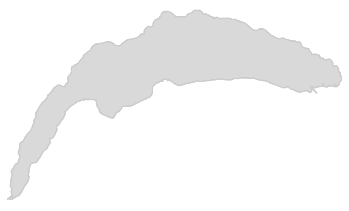

In [56]:
fig_size = (6,6.6)
font_feature = ['Times New Roman', 20, 20] # [fontname, fontsize_labels, fontsize_ticks]
colormap = 'inferno'#cmocean.cm.oxy #cmocean.cm.thermal

f = plt.figure(figsize=fig_size)

ax = f.add_subplot(111)
SS1 = plt.fill(xs,ys,color='k',alpha=0.15)
plt.hold = True
# SS = plt.pcolormesh(xp_conv[:-1,:-1],yp_conv[:-1,:-1],part_no_prob, cmap=colormap,vmin=0, vmax=np.nanquantile(part_no_prob,.999),shading='flat',visible=True)
ax.plot(xs,ys, color='#CDCDCD', lw=1.)

plt.xticks(fontname=font_feature[0],fontsize=font_feature[2])
plt.yticks(fontname=font_feature[0],fontsize=font_feature[2])

ax.set_xticks([])
ax.set_yticks([])
ax.set_xlim(500, 561)
ax.set_ylim(117, 153)
ax.set_aspect('equal')
# ax.get_xaxis().set_visible(False)
# ax.get_yaxis().set_visible(False)
ax.axis('off')

# plt.savefig(plt_path+'lake.png',dpi=300, bbox_inches = 'tight')

plt.show()
plt.close()

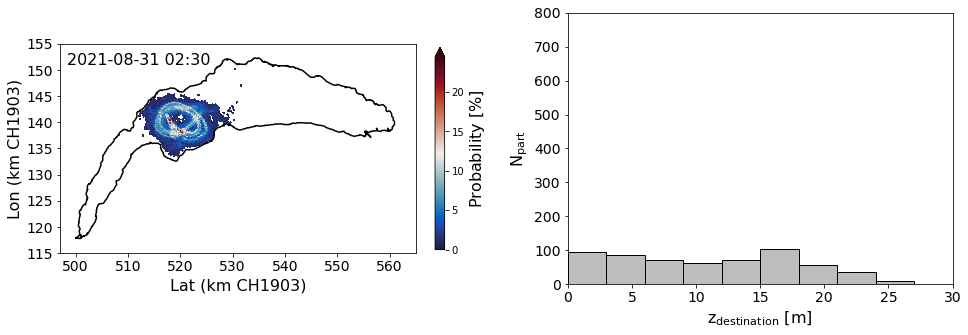

In [18]:
# initialization
qq = 1
###############
ii=1
tr = data.sel(pid=qq, drop=True)
time_plt = time.where(tr.itrack < 1e6, drop=True)
xp = np.array(tr.xtrack[:qq])
yp = np.array(tr.xtrack[:qq])
zp_orig = np.array(tr.ztrack[qq])
part_no_prob, _, _ = np.histogram2d(xp, yp, bins=[xg_plt[0,:],yg_plt[:,0]])
part_no_prob = part_no_prob.T
part_no_prob[:,:] = 0


for qq in (range(1,len(time))):
    ###############
    ii=1
    tr = data.sel(pid=qq, drop=True)
    time_plt = time.where(tr.itrack < 1e6, drop=True)
    xp = np.array(tr.xtrack[:qq])
    yp = np.array(tr.xtrack[:qq])
    zp_orig = np.array(tr.ztrack[qq])
    part_no_prob, _, _ = np.histogram2d(xp, yp, bins=[xg_plt[0,:],yg_plt[:,0]])
    part_no_prob = part_no_prob.T
    part_no_prob[:,:] = 0
    
    zp_orig = []
    # for ii in sel_pid[5::100]:
    for ii in sel_pid[5::50]:
        tr = data.sel(pid=ii, drop=True)
        xp = np.array(tr.xtrack[:qq])
        yp = np.array(tr.ytrack[:qq])
        zp = np.array(tr.ztrack[qq])
        zp_orig.append(np.atleast_1d(tr.ztrack[qq])[0])
        part_prob_dum, _, _ = np.histogram2d(xp, yp, bins=[xg_plt[0,:],yg_plt[:,0]])
        part_prob_dum = part_prob_dum.T
        part_prob_dum[part_prob_dum>0] = 1
        part_no_prob = part_no_prob+part_prob_dum
    # part_no_prob = 100*part_no_prob/len(sel_pid[5::100])
    part_no_prob = 100*part_no_prob/len(sel_pid[5::50])
    part_no_prob[part_no_prob<1] = np.nan

    fig_size = (16,5)

    f = plt.figure(figsize=fig_size)

    ax = f.add_subplot(121)
    # SS = plt.pcolormesh(xx_sg,yy_sg,Temp, cmap=cmocean.cm.thermal,shading='flat')
    SS = plt.pcolormesh(xp_conv[:-1,:-1],yp_conv[:-1,:-1],part_no_prob, cmap=cmocean.cm.balance,vmin=0, vmax=np.nanquantile(part_no_prob,.999),shading='flat')
    plt.hold=True
    ax.plot(xs,ys, 'k-', lw=1.5)

    plt.xticks(fontname=font_feature[0],fontsize=font_feature[2])
    plt.yticks(fontname=font_feature[0],fontsize=font_feature[2])

    # cbar = plt.colorbar(fraction=0.04,orientation="vertical",pad=-0.25,extend='max');
    cbar = plt.colorbar(fraction=0.025,extend='max');
    # cbar.ax.set_xticks([0,10,20,30])
    # cbar.ax.set_xticklabels([0,10,20,30],fontname=font_feature[0],fontsize=font_feature[2])

    cbar.set_label(label='$\mathregular{Probability \ [\%]}$',family=font_feature[0],size=font_feature[1])
    cbar.ax.xaxis.set_ticks_position('top')

    ax.set_xlim(497, 565)
    ax.set_ylim(115, 155)
    ax.set_aspect('equal')
    ax.set_xlabel("Lat (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
    ax.set_ylabel("Lon (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
    ax.annotate(str(time[qq].values.astype("datetime64[m]")).replace("T", " "),xy=(0.02, 0.9), xycoords='axes fraction',fontname=font_feature[0],fontsize=font_feature[1])


    ax2 = f.add_subplot(122)
    # SS = plt.pcolormesh(xx_sg,yy_sg,Temp, cmap=cmocean.cm.thermal,shading='flat')
    SS = ax2.hist(zp_orig, bins=np.arange(0,30,3), color='#BDBDBD', edgecolor='k')
    ax2.set_xlim(0, 30)
    ax2.set_ylim(0, 800)

    plt.xticks(fontname=font_feature[0],fontsize=font_feature[2])
    plt.yticks(fontname=font_feature[0],fontsize=font_feature[2])

    ax2.set_xlabel("$\mathregular{z_{destination} \ [m]}$",fontname=font_feature[0],fontsize=font_feature[1])
    ax2.set_ylabel("$\mathregular{N_{part}}$",fontname=font_feature[0],fontsize=font_feature[1])
    # ax.annotate(date_obs[0].item().strftime("%Y-%m-%d %H:%M"),xy=(0.02, 0.9), xycoords='axes fraction',fontname=font_feature[0],fontsize=font_feature[1])

    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.32, hspace=0.05)
    plt.savefig(output_path+str(qq).zfill(3)+'_'+str(time[qq].values.astype("datetime64[m]")).replace("T", " ")[0:10]+'H'+str(time[qq].values.astype("datetime64[m]")).replace("T", " ")[11:13]+'.png',dpi=300, bbox_inches = 'tight')
    plt.show()
    plt.close()

In [12]:
import cv2
import os

image_folder = 'G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT3_backward_west/pt_probability/'
video_name = image_folder+'GVA_PT3_backward_west_3m_Sep2021_probabilty.avi'

images = [img for img in os.listdir(image_folder) if img.endswith(".png")]
frame = cv2.imread(os.path.join(image_folder, images[0]))
height, width, layers = frame.shape

video = cv2.VideoWriter(video_name, 0, 1, (width,height))

for image in images:
    video.write(cv2.imread(os.path.join(image_folder, image)))

cv2.destroyAllWindows()
video.release()

In [ ]:
qq = 48
###############
for zd in zdata:
    # now = zd.sel(time=np.datetime64(cutoff_date), drop=True)
    now = zd.sel(time=time[qq], drop=True)
    xp = (now.xtrack).to_masked_array().filled()
    xp[xp > 1e9] = np.nan
    yp = now.ytrack.to_masked_array().filled()
    yp[yp > 1e9] = np.nan
    zp = now.ztrack.to_masked_array().filled()
    zp[zp > 310] = np.nan


###############   
part_no_snap, _, _ = np.histogram2d(xp, yp, bins=[xg_plt[0,:],yg_plt[:,0]])
part_no_snap = part_no_snap.T
part_no_snap[part_no_snap<1] = np.nan

############### 
part_depth_snap = part_no_snap.copy()
part_depth_snap[:,:] = 0

for ii in range(len(xp)):
    if ((~np.isnan(xp[ii])) & (~np.isnan(yp[ii]))):
        ind_x = np.searchsorted(0.5*(xg_plt[0,:-1]+xg_plt[0,1:]),xp[ii])
        ind_y = np.searchsorted(0.5*(yg_plt[:-1,0]+yg_plt[1:,0]),yp[ii])
        if (~np.isnan(zp[ii])):
            part_depth_snap[ind_y,ind_x] = part_depth_snap[ind_y,ind_x]+zp[ii]

part_depth_snap = part_depth_snap/part_no_snap
part_depth_snap[part_depth_snap>60] = np.nan

In [57]:
data_dir

'G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT2_backward_center/'

# particle concentration snapshots

In [66]:
# data_dir = "E:/ALPLakes/Codes/Ctracker/config_for_cscs/PT1_backward_east/"
# fname = "PT1_backward_3depths"
# data_dir = "G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT_secchi_low/PT9_backward_east/"
data_dir = "G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT_secchi_low/PT13_forward_south/"
fname = "PT13_forward_south"
# fname = "PT_test"
# data_dir = "E:/ALPLakes/Codes/Ctracker/config_for_cscs/PT3_backward_west/"
# fname = "PT3_backward_3depths"
data_file = join(data_dir, "%s_run.nc" % fname)
inout_file = join(data_dir, "%s_inout.nc" % fname)

In [67]:
# open without chunks otherwise loading takes forever
data = xr.open_dataset(data_file, decode_times=True)
inout = xr.open_dataset(inout_file, decode_times=True)
time_plt = data.time

In [68]:
# realease depth which will be plotted
z0 = [0.5,1,3,5]
zdata = []
for zz in z0:
    sel_pid = inout.pid.where(inout.z_ini==zz, drop=True)
    zd = data.sel(pid=sel_pid, drop=True)
    zd.xtrack.load()
    zd.ytrack.load()
    zd.ztrack.load()
    zdata.append(zd)

In [69]:
# output_path = 'G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT6_forward_map/pt_dispersion_snapshots_3/'
output_path = data_dir+'pt_dispersion_snapshots_to3/'  
no_pix_smooth = 4
xg_plt = xG.to_masked_array().filled()[::no_pix_smooth ,::no_pix_smooth ]
yg_plt = yG.to_masked_array().filled()[::no_pix_smooth ,::no_pix_smooth ]
font_feature = ['sans-serif', 16, 14] # [fontname, fontsize_labels, fontsize_ticks]
gridAngle = np.arctan2(Y1-Y0, X1-X0)
xp_conv = (np.cos(gridAngle)*xg_plt - np.sin(gridAngle)*yg_plt) + X0
yp_conv = (np.sin(gridAngle)*xg_plt + np.cos(gridAngle)*yg_plt) + Y0

xp_conv *= 1.e-3
yp_conv *= 1.e-3

In [15]:
np.nanquantile(part_no_snap,0.25)

NameError: name 'part_no_snap' is not defined

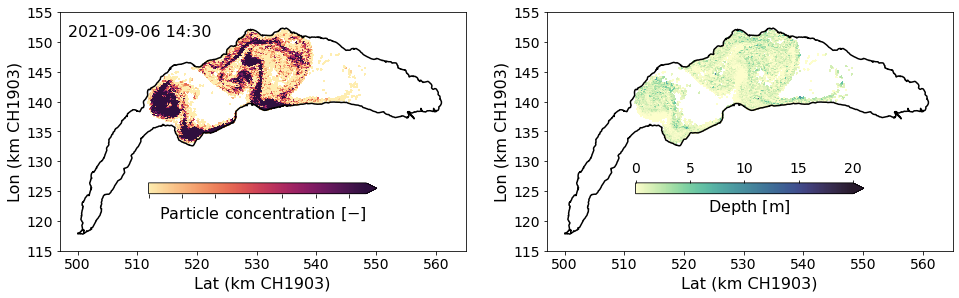

In [73]:
for qq in [len(time_plt)-2]: #range(len(time_plt)):
    # cutoff_date = '2021-09-05T09:30:00.000000000'

    ###############
    for zd in zdata:
        # now = zd.sel(time=np.datetime64(cutoff_date), drop=True)
        now = zd.sel(time=time_plt[qq], drop=True)
        xp = (now.xtrack).to_masked_array().filled()
        xp[xp > 1e9] = np.nan
        yp = now.ytrack.to_masked_array().filled()
        yp[yp > 1e9] = np.nan
        zp = now.ztrack.to_masked_array().filled()
        zp[zp > 310] = np.nan


    ###############   
    part_no_snap, _, _ = np.histogram2d(xp, yp, bins=[xg_plt[0,:],yg_plt[:,0]])
    part_no_snap = part_no_snap.T
    part_no_snap[part_no_snap<2] = np.nan
    min_val = 2 #np.nanquantile(part_no_snap,0.2)
    part_no_snap[part_no_snap<min_val] = np.nan
    # max_val = np.nanquantile(part_no_snap,0.8)
    

    ############### 
    part_depth_snap = part_no_snap.copy()
    part_depth_snap[:,:] = 0

    for ii in range(len(xp)):
        if ((~np.isnan(xp[ii])) & (~np.isnan(yp[ii]))):
            ind_x = np.searchsorted(0.5*(xg_plt[0,:-1]+xg_plt[0,1:]),xp[ii])
            ind_y = np.searchsorted(0.5*(yg_plt[:-1,0]+yg_plt[1:,0]),yp[ii])
            if ((~np.isnan(zp[ii])) & (zp[ii]<5)):
                part_depth_snap[ind_y,ind_x] = part_depth_snap[ind_y,ind_x]+zp[ii]

    part_depth_snap = part_depth_snap/part_no_snap
    # part_depth_snap[part_depth_snap>60] = np.nan
    # part_no_snap[part_depth_snap>10] = np.nan

    fig_size = (16,5)


    f = plt.figure(figsize=fig_size)
    #cmocean.cm.balance
    ax = f.add_subplot(121)
    # SS = plt.pcolormesh(xx_sg,yy_sg,Temp, cmap=cmocean.cm.thermal,shading='flat')
    SS = plt.pcolormesh(xp_conv[:-1,:-1],yp_conv[:-1,:-1],part_no_snap,vmin=np.nanquantile(part_no_snap,0.25), vmax=np.nanquantile(part_no_snap,0.75), cmap=cmocean.cm.matter,shading='flat')
    plt.hold=True
    ax.plot(xs,ys, 'k-', lw=1.5)

    plt.xticks(fontname=font_feature[0],fontsize=font_feature[2])
    plt.yticks(fontname=font_feature[0],fontsize=font_feature[2])

    ax.set_xlim(497, 565)
    ax.set_ylim(115, 155)
    ax.set_aspect('equal')
    ax.set_xlabel("Lat (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
    ax.set_ylabel("Lon (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
    ax.annotate(str(time_plt[qq].values.astype("datetime64[m]")).replace("T", " "),xy=(0.02, 0.9), xycoords='axes fraction',fontname=font_feature[0],fontsize=font_feature[1])

    cbar = plt.colorbar(fraction=0.04,orientation="horizontal",pad=-0.25,extend='max');
    cbar.ax.set_xticklabels([])
    cbar.ax.set_xticks([])
    cbar.set_label(label='$\mathregular{Particle \ concentration\ [-]}$',family=font_feature[0],size=font_feature[1])


    ax2 = f.add_subplot(122)
    # SS = plt.pcolormesh(xx_sg,yy_sg,Temp, cmap=cmocean.cm.thermal,shading='flat')
    SS = plt.pcolormesh(xp_conv[:-1,:-1],yp_conv[:-1,:-1],part_depth_snap, cmap=cmocean.cm.deep,vmin=0, vmax=20,shading='flat')
    plt.hold=True
    ax2.plot(xs,ys, 'k-', lw=1.5)

    plt.xticks(fontname=font_feature[0],fontsize=font_feature[2])
    plt.yticks(fontname=font_feature[0],fontsize=font_feature[2])

    ax2.set_xlim(497, 565)
    ax2.set_ylim(115, 155)
    ax2.set_aspect('equal')
    ax2.set_xlabel("Lat (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
    ax2.set_ylabel("Lon (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])


    cbar2 = plt.colorbar(fraction=0.04,orientation="horizontal",pad=-0.25,extend='max',format='%:.0f');
    cbar2.ax.set_xticklabels([0,5,10,15,20],fontname=font_feature[0],fontsize=font_feature[2])
    cbar2.set_label(label='$\mathregular{Depth\ [m]}$',family=font_feature[0],size=font_feature[1])
    cbar2.ax.xaxis.set_ticks_position('top')

    plt.savefig(output_path+str(qq).zfill(3)+'_'+str(time_plt[qq].values.astype("datetime64[m]")).replace("T", " ")[0:10]+'H'+str(time[qq].values.astype("datetime64[m]")).replace("T", " ")[11:13]+'.png',dpi=300, bbox_inches = 'tight')

    plt.show()
    plt.close()

### weighted depth concentration

In [108]:
no_pix_smooth = 3
xg_plt = xG.to_masked_array().filled()[::no_pix_smooth ,::no_pix_smooth ]
yg_plt = yG.to_masked_array().filled()[::no_pix_smooth ,::no_pix_smooth ]
font_feature = ['sans-serif', 16, 14] # [fontname, fontsize_labels, fontsize_ticks]
gridAngle = np.arctan2(Y1-Y0, X1-X0)
xp_conv = (np.cos(gridAngle)*xg_plt - np.sin(gridAngle)*yg_plt) + X0
yp_conv = (np.sin(gridAngle)*xg_plt + np.cos(gridAngle)*yg_plt) + Y0

xp_conv *= 1.e-3
yp_conv *= 1.e-3

In [109]:
qq=len(time_plt)-2
for zd in zdata:
    # now = zd.sel(time=np.datetime64(cutoff_date), drop=True)
    now = zd.sel(time=time_plt[qq], drop=True)
    xp = (now.xtrack).to_masked_array().filled()
    xp[xp > 1e9] = np.nan
    yp = now.ytrack.to_masked_array().filled()
    yp[yp > 1e9] = np.nan
    zp = now.ztrack.to_masked_array().filled()
    zp[zp > 310] = np.nan

In [117]:
part_no_snap, _, _ = np.histogram2d(xp, yp, bins=[xg_plt[0,:],yg_plt[:,0]])
part_no_snap = part_no_snap.T

In [118]:
part_no_snap.shape

(176, 448)

In [120]:
xp_conv.shape

(177, 449)

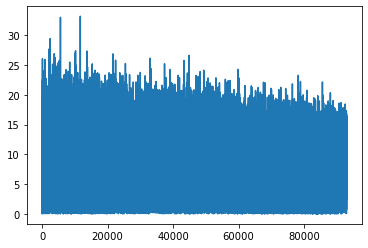

In [125]:
plt.plot(zp)

In [146]:
1.44/3.5

0.4114285714285714

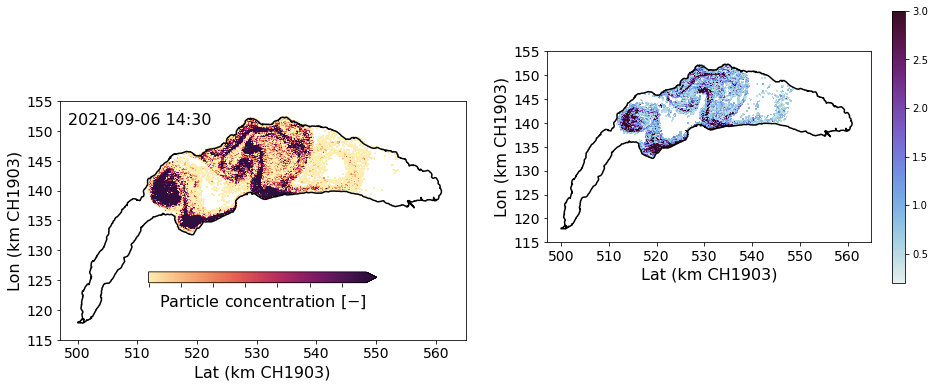

In [167]:
for qq in [len(time_plt)-2]: #range(len(time_plt)):
    # cutoff_date = '2021-09-05T09:30:00.000000000'

    ###############
    for zd in zdata:
        # now = zd.sel(time=np.datetime64(cutoff_date), drop=True)
        now = zd.sel(time=time_plt[qq], drop=True)
        xp = (now.xtrack).to_masked_array().filled()
        xp[xp > 1e9] = np.nan
        yp = now.ytrack.to_masked_array().filled()
        yp[yp > 1e9] = np.nan
        zp = now.ztrack.to_masked_array().filled()
        zp[zp > 310] = np.nan


    ###############   
    part_no_snap, _, _ = np.histogram2d(xp, yp, bins=[xg_plt[0,:],yg_plt[:,0]])
    part_no_snap = part_no_snap.T
#     part_no_snap[part_no_snap<2] = np.nan
    min_val = 1 #np.nanquantile(part_no_snap,0.2)
    part_no_snap[part_no_snap<min_val] = np.nan
    # max_val = np.nanquantile(part_no_snap,0.8)
    

    ############### 
    part_depth_snap = part_no_snap.copy()
    part_depth_snap[:,:] = 0

    for ii in range(len(xp)):
        if ((~np.isnan(xp[ii])) & (~np.isnan(yp[ii]))):
            ind_x = np.searchsorted(0.5*(xg_plt[0,:-1]+xg_plt[0,1:]),xp[ii])
            ind_y = np.searchsorted(0.5*(yg_plt[:-1,0]+yg_plt[1:,0]),yp[ii])
            if (~np.isnan(zp[ii])):
                part_depth_snap[ind_y,ind_x] = part_depth_snap[ind_y,ind_x]+np.exp(-0.45*zp[ii])

#     part_depth_snap = part_depth_snap/part_no_snap
#     part_depth_snap[part_depth_snap>60] = np.nan
    part_depth_snap[part_depth_snap<0.4] = np.nan

    fig_size = (16,5)


    f = plt.figure(figsize=fig_size)
    #cmocean.cm.balance
    ax = f.add_subplot(121)
    # SS = plt.pcolormesh(xx_sg,yy_sg,Temp, cmap=cmocean.cm.thermal,shading='flat')
    SS = plt.pcolormesh(xp_conv[1:,1:],yp_conv[1:,1:],part_no_snap,vmin=np.nanquantile(part_no_snap,0.25), vmax=np.nanquantile(part_no_snap,0.75), cmap=cmocean.cm.matter,shading='flat')
    plt.hold=True
    ax.plot(xs,ys, 'k-', lw=1.5)

    plt.xticks(fontname=font_feature[0],fontsize=font_feature[2])
    plt.yticks(fontname=font_feature[0],fontsize=font_feature[2])

    ax.set_xlim(497, 565)
    ax.set_ylim(115, 155)
    ax.set_aspect('equal')
    ax.set_xlabel("Lat (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
    ax.set_ylabel("Lon (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
    ax.annotate(str(time_plt[qq].values.astype("datetime64[m]")).replace("T", " "),xy=(0.02, 0.9), xycoords='axes fraction',fontname=font_feature[0],fontsize=font_feature[1])

    cbar = plt.colorbar(fraction=0.04,orientation="horizontal",pad=-0.25,extend='max');
    cbar.ax.set_xticklabels([])
    cbar.ax.set_xticks([])
    cbar.set_label(label='$\mathregular{Particle \ concentration\ [-]}$',family=font_feature[0],size=font_feature[1])


    ax2 = f.add_subplot(122)
    # SS = plt.pcolormesh(xx_sg,yy_sg,Temp, cmap=cmocean.cm.thermal,shading='flat')
    SS = plt.pcolormesh(xp_conv[:-1,:-1],yp_conv[:-1,:-1],part_depth_snap, vmin=0.2,vmax=3, cmap=cmocean.cm.dense,shading='flat')
    plt.hold=True
    ax2.plot(xs,ys, 'k-', lw=1.5)

    plt.xticks(fontname=font_feature[0],fontsize=font_feature[2])
    plt.yticks(fontname=font_feature[0],fontsize=font_feature[2])

    ax2.set_xlim(497, 565)
    ax2.set_ylim(115, 155)
    ax2.set_aspect('equal')
    ax2.set_xlabel("Lat (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
    ax2.set_ylabel("Lon (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])

    plt.colorbar()
#     cbar2 = plt.colorbar(fraction=0.04,orientation="horizontal",pad=-0.25,extend='max',format='%:.0f');
#     cbar2.ax.set_xticklabels(fontname=font_feature[0],fontsize=font_feature[2])
#     cbar2.set_label(label='$\mathregular{Depth\ [m]}$',family=font_feature[0],size=font_feature[1])
#     cbar2.ax.xaxis.set_ticks_position('top')

#     plt.savefig(output_path+str(qq).zfill(3)+'_'+str(time_plt[qq].values.astype("datetime64[m]")).replace("T", " ")[0:10]+'H'+str(time[qq].values.astype("datetime64[m]")).replace("T", " ")[11:13]+'.png',dpi=300, bbox_inches = 'tight')

    plt.show()
    plt.close()

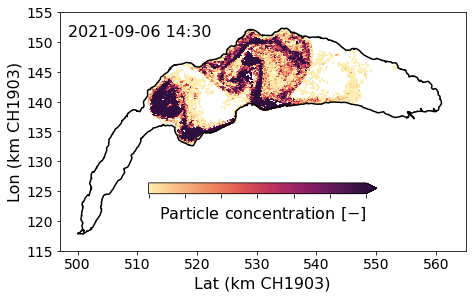

In [77]:
for qq in [len(time_plt)-2]: #range(len(time_plt)):
    # cutoff_date = '2021-09-05T09:30:00.000000000'

    ###############
    for zd in zdata:
        # now = zd.sel(time=np.datetime64(cutoff_date), drop=True)
        now = zd.sel(time=time_plt[qq], drop=True)
        xp = (now.xtrack).to_masked_array().filled()
        xp[xp > 1e9] = np.nan
        yp = now.ytrack.to_masked_array().filled()
        yp[yp > 1e9] = np.nan
        zp = now.ztrack.to_masked_array().filled()
        zp[zp > 310] = np.nan


    ###############   
    part_no_snap, _, _ = np.histogram2d(xp, yp, bins=[xg_plt[0,:],yg_plt[:,0]])
    part_no_snap = part_no_snap.T
    part_no_snap[part_no_snap<2] = np.nan
    min_val = 2 #np.nanquantile(part_no_snap,0.2)
    part_no_snap[part_no_snap<min_val] = np.nan
    # max_val = np.nanquantile(part_no_snap,0.8)
    

    ############### 
    part_depth_snap = part_no_snap.copy()
    part_depth_snap[:,:] = 0

    for ii in range(len(xp)):
        if ((~np.isnan(xp[ii])) & (~np.isnan(yp[ii]))):
            ind_x = np.searchsorted(0.5*(xg_plt[0,:-1]+xg_plt[0,1:]),xp[ii])
            ind_y = np.searchsorted(0.5*(yg_plt[:-1,0]+yg_plt[1:,0]),yp[ii])
            if (~np.isnan(zp[ii])):
                part_depth_snap[ind_y,ind_x] = part_depth_snap[ind_y,ind_x]+zp[ii]

    part_depth_snap = part_depth_snap/part_no_snap
    part_depth_snap[part_depth_snap>60] = np.nan
    part_no_snap[part_depth_snap>11] = np.nan

    fig_size = (16,5)


    f = plt.figure(figsize=fig_size)
    #cmocean.cm.balance
    ax = f.add_subplot(121)
    # SS = plt.pcolormesh(xx_sg,yy_sg,Temp, cmap=cmocean.cm.thermal,shading='flat')
    SS = plt.pcolormesh(xp_conv[:-1,:-1],yp_conv[:-1,:-1],part_no_snap,vmin=np.nanquantile(part_no_snap,0.25), vmax=np.nanquantile(part_no_snap,0.75), cmap=cmocean.cm.matter,shading='flat')
    plt.hold=True
    ax.plot(xs,ys, 'k-', lw=1.5)

    plt.xticks(fontname=font_feature[0],fontsize=font_feature[2])
    plt.yticks(fontname=font_feature[0],fontsize=font_feature[2])

    ax.set_xlim(497, 565)
    ax.set_ylim(115, 155)
    ax.set_aspect('equal')
    ax.set_xlabel("Lat (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
    ax.set_ylabel("Lon (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
    ax.annotate(str(time_plt[qq].values.astype("datetime64[m]")).replace("T", " "),xy=(0.02, 0.9), xycoords='axes fraction',fontname=font_feature[0],fontsize=font_feature[1])

    cbar = plt.colorbar(fraction=0.04,orientation="horizontal",pad=-0.25,extend='max');
    cbar.ax.set_xticklabels([])
    cbar.ax.set_xticks([])
    cbar.set_label(label='$\mathregular{Particle \ concentration\ [-]}$',family=font_feature[0],size=font_feature[1])


#     plt.savefig(output_path+str(qq).zfill(3)+'_'+str(time_plt[qq].values.astype("datetime64[m]")).replace("T", " ")[0:10]+'H'+str(time[qq].values.astype("datetime64[m]")).replace("T", " ")[11:13]+'.png',dpi=300, bbox_inches = 'tight')

    plt.show()
    plt.close()

# plots for the paper

In [13]:
def open_pt_output(data_file,inout_file,time_qq):
    data = xr.open_dataset(data_file, decode_times=True)
    inout = xr.open_dataset(inout_file, decode_times=True)
    time_plt = data.time

    # realease depth which will be plotted
    z0 = [0.5,1,3,5]
    zdata = []
    for zz in z0:
        sel_pid = inout.pid.where(inout.z_ini==zz, drop=True)
        zd = data.sel(pid=sel_pid, drop=True)
        zd.xtrack.load()
        zd.ytrack.load()
        zd.ztrack.load()
        zdata.append(zd)
        
    for zd in zdata:
        # now = zd.sel(time=np.datetime64(cutoff_date), drop=True)
        now = zd.sel(time=time_qq, drop=True)
        xp = (now.xtrack).to_masked_array().filled()
        xp[xp > 1e9] = np.nan
        yp = now.ytrack.to_masked_array().filled()
        yp[yp > 1e9] = np.nan
        zp = now.ztrack.to_masked_array().filled()
        zp[zp > 310] = np.nan
        
    return xp,yp,zp

In [14]:
# data_dir = "E:/ALPLakes/Codes/Ctracker/config_for_cscs/PT1_backward_east/"
# fname = "PT1_backward_3depths"
# data_dir = "G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT_secchi_low/PT9_backward_east/"
data_dir = "G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT_secchi_low/PT13_forward_south/100PT"
fname = "PT13_forward_south"
# fname = "PT_test"
# data_dir = "E:/ALPLakes/Codes/Ctracker/config_for_cscs/PT3_backward_west/"
# fname = "PT3_backward_3depths"
data_file = join(data_dir, "%s_1_run.nc" % fname)
inout_file = join(data_dir, "%s_1_inout.nc" % fname)

# open without chunks otherwise loading takes forever
data = xr.open_dataset(data_file, decode_times=True)
inout = xr.open_dataset(inout_file, decode_times=True)
time_plt = data.time

#### added recently
xG = data.XG_p1
yG = data.YG_p1
xC = data.XC
yC = data.YC
bathy = data.Depth.to_masked_array()

####

# realease depth which will be plotted
z0 = [0.5,1,3,5]
zdata = []
for zz in z0:
    sel_pid = inout.pid.where(inout.z_ini==zz, drop=True)
    zd = data.sel(pid=sel_pid, drop=True)
    zd.xtrack.load()
    zd.ytrack.load()
    zd.ztrack.load()
    zdata.append(zd)
    
    
###
no_pix_smooth = 3
xg_plt = xG.to_masked_array().filled()[::no_pix_smooth ,::no_pix_smooth ]
yg_plt = yG.to_masked_array().filled()[::no_pix_smooth ,::no_pix_smooth ]
gridAngle = np.arctan2(Y1-Y0, X1-X0)
xp_conv = (np.cos(gridAngle)*xg_plt - np.sin(gridAngle)*yg_plt) + X0
yp_conv = (np.sin(gridAngle)*xg_plt + np.cos(gridAngle)*yg_plt) + Y0

xp_conv *= 1.e-3
yp_conv *= 1.e-3

In [15]:
qq = len(time_plt)-2
for zd in zdata:
    # now = zd.sel(time=np.datetime64(cutoff_date), drop=True)
    now = zd.sel(time=time_plt[qq], drop=True)
    xp = (now.xtrack).to_masked_array().filled()
    xp[xp > 1e9] = np.nan
    yp = now.ytrack.to_masked_array().filled()
    yp[yp > 1e9] = np.nan
    zp = now.ztrack.to_masked_array().filled()
    zp[zp > 310] = np.nan
xp_tot = xp.copy()
yp_tot = yp.copy()
zp_tot = zp.copy()


###############
for ii in range(2,6):
    data_file = join(data_dir, "PT13_forward_south_%d_run.nc" %ii)
    inout_file = join(data_dir, "PT13_forward_south_%d_inout.nc" %ii)

    xp,yp,zp = open_pt_output(data_file,inout_file,time_plt[qq])

    xp_tot = np.concatenate((xp_tot,xp))
    yp_tot = np.concatenate((yp_tot,yp))
    zp_tot = np.concatenate((zp_tot,zp))

In [16]:
data_dir = "G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT_secchi_low/PT13_forward_south/"
fname = "PT13_forward_south"
# fname = "PT_test"
# data_dir = "E:/ALPLakes/Codes/Ctracker/config_for_cscs/PT3_backward_west/"
# fname = "PT3_backward_3depths"
data_file = join(data_dir, "%s_run.nc" % fname)
inout_file = join(data_dir, "%s_inout.nc" % fname)
xp,yp,zp = open_pt_output(data_file,inout_file,time_plt[qq])

xp_tot = np.concatenate((xp_tot,xp))
yp_tot = np.concatenate((yp_tot,yp))
zp_tot = np.concatenate((zp_tot,zp))

In [17]:
data_dir = "G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT_secchi_low/PT13_forward_south/100PT"
fname = "PT13_forward_south"
###############
for ii in range(8,9):
    data_file = join(data_dir, "PT13_forward_south_%d_run.nc" %ii)
    inout_file = join(data_dir, "PT13_forward_south_%d_inout.nc" %ii)

    xp,yp,zp = open_pt_output(data_file,inout_file,time_plt[qq])

    xp_tot = np.concatenate((xp_tot,xp))
    yp_tot = np.concatenate((yp_tot,yp))
    zp_tot = np.concatenate((zp_tot,zp))

In [18]:
plt_path = 'G:/ALPLakes/algal_bloom_Sep2021/manuscript/plots/'

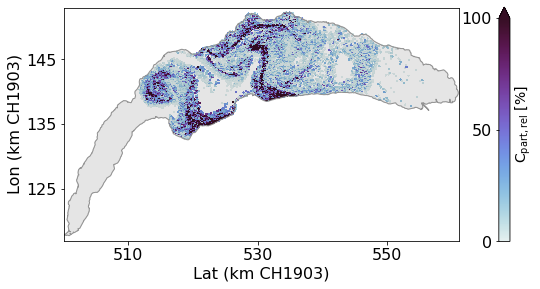

In [22]:
fig_size = (8,8.5)
font_feature = ['sans-serif', 16, 16] # [fontname, fontsize_labels, fontsize_ticks]
###############   
part_no_snap, _, _ = np.histogram2d(xp_tot, yp_tot, bins=[xg_plt[0,:],yg_plt[:,0]])
part_no_snap = part_no_snap.T
#     part_no_snap[part_no_snap<2] = np.nan
min_val = 1 #np.nanquantile(part_no_snap,0.2)
part_no_snap[part_no_snap<min_val] = np.nan
# max_val = np.nanquantile(part_no_snap,0.8)

############### 
part_depth_snap = part_no_snap.copy()
part_depth_snap[:,:] = 0

for ii in range(len(xp_tot)):
    if ((~np.isnan(xp_tot[ii])) & (~np.isnan(yp_tot[ii]))):
        ind_x = np.searchsorted(0.5*(xg_plt[0,:-1]+xg_plt[0,1:]),xp_tot[ii])
        ind_y = np.searchsorted(0.5*(yg_plt[:-1,0]+yg_plt[1:,0]),yp_tot[ii])
        if (~np.isnan(zp_tot[ii])):
            part_depth_snap[ind_y,ind_x] = part_depth_snap[ind_y,ind_x]+np.exp(-2*0.4097*zp_tot[ii])

#     part_depth_snap = part_depth_snap/part_no_snap
#     part_depth_snap[part_depth_snap>60] = np.nan
part_depth_snap[part_depth_snap<0.01] = np.nan


f = plt.figure(figsize=fig_size)

ax2 = f.add_subplot(111)
SS1 = plt.fill(xs,ys,color='k',alpha=0.1)
plt.hold = True
SS = plt.pcolormesh(xp_conv[:-1,:-1],yp_conv[:-1,:-1],100*part_depth_snap/2.1, vmin=0,vmax=100, cmap=cmocean.cm.dense,shading='flat')
plt.hold=True
ax2.plot(xs,ys, color='#939393', lw=1.)

plt.xticks(fontname=font_feature[0],fontsize=font_feature[2])
plt.yticks(fontname=font_feature[0],fontsize=font_feature[2])

ax2.set_xticks([510,530,550])
ax2.set_yticks([125,135,145])

ax2.set_xlim(500, 561)
ax2.set_ylim(117, 153)
ax2.set_aspect('equal')
ax2.set_xlabel("Lat (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
ax2.set_ylabel("Lon (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])

# axins1 = inset_axes(ax2,
#                     width="3%",  # width = 50% of parent_bbox width
#                     height="100%",  # height : 5%
#                     loc='upper right',bbox_to_anchor=(0.06, 0.8, 1, 1.1),bbox_transform=ax.transAxes,)
# cbar = plt.colorbar(cax=axins1,fraction=0.02,orientation="vertical",pad=-0.3,extend='max',shrink=0.8,aspect=20,ticks=[0,50,100],panchor=(0,0.5));
# cbar.ax.set_yticklabels([0,50,100],fontname=font_feature[0],fontsize=font_feature[2]-2)
# cbar.set_label(label='$\mathregular{C_{part,rel} \ [\%]}$',family=font_feature[0],size=font_feature[1]-2)
# cbar.ax.yaxis.set_ticks_position('left')

cbar = plt.colorbar(fraction=0.025,orientation="vertical",pad=0.09,extend='max',ticks=[0,50,100]);
cbar.ax.set_yticklabels([0,50,100],fontname=font_feature[0],fontsize=font_feature[2])
cbar.set_label(label='$\mathregular{C_{part,rel} \ [\%]}$',family=font_feature[0],size=font_feature[1]-2)
cbar.ax.yaxis.set_ticks_position('left')

# plt.savefig(plt_path+'pt_relative_conc_densecmp_revsansserif.png',dpi=300, bbox_inches = 'tight')

plt.show()
plt.close()

In [21]:
# xx_save =xp_conv[:-1,:-1]
# yy_save = yp_conv[:-1,:-1]
# c_part_save = 100*part_depth_snap/2.1

# forward_south_file = 'G:/ALPLakes/algal_bloom_Sep2021/new_results/ForwardParticleTracking_LakeGeneva_6Sep2021.npz'
# np.savez(forward_south_file, xx=xx_save, yy=yy_save, C_part_rel=c_part_save)

### plot for the new movie

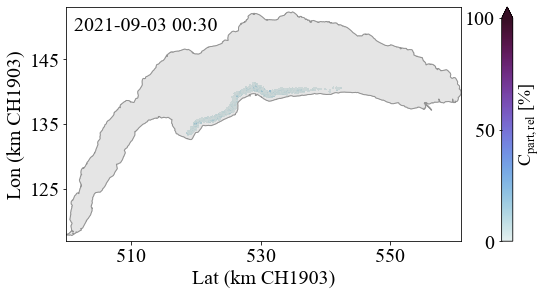

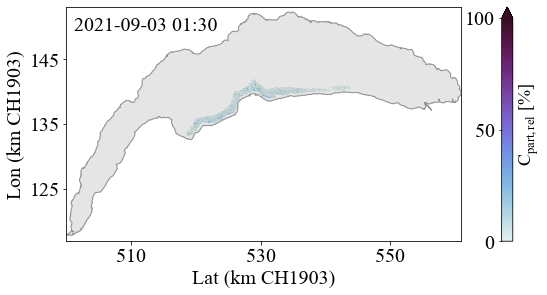

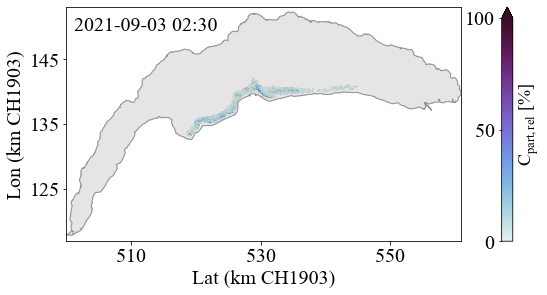

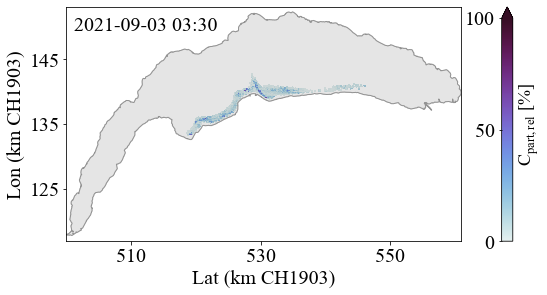

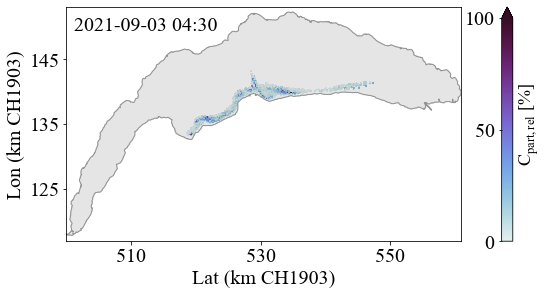

...

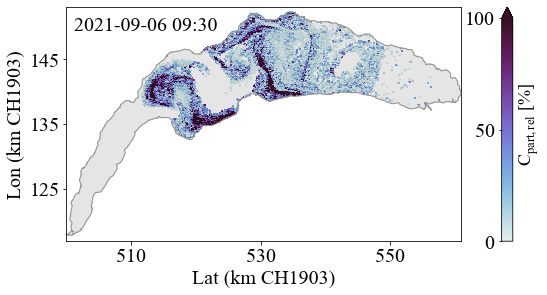

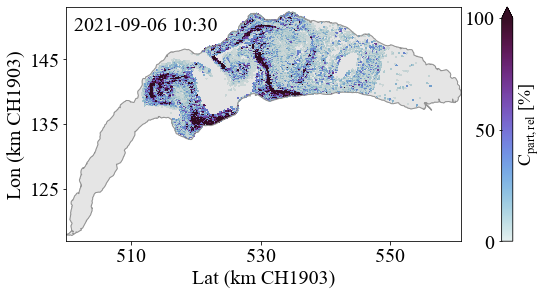

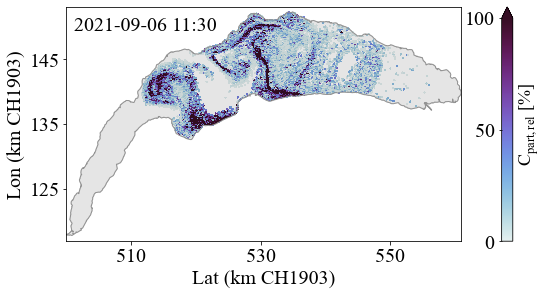

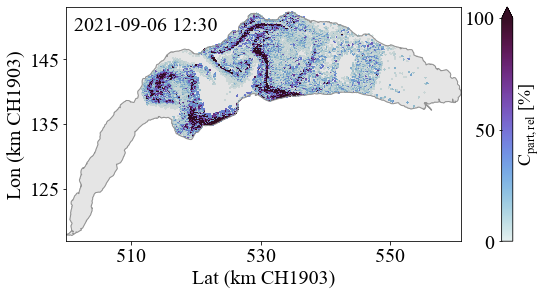

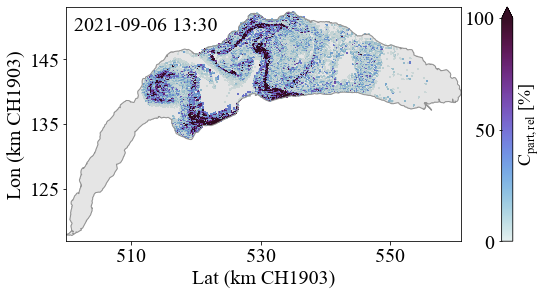

In [36]:
plt_path = 'E:/ALPLakes/conferences/surf_day2022/plots/'

for qq in range(len(time_plt)-2):
    for zd in zdata:
        # now = zd.sel(time=np.datetime64(cutoff_date), drop=True)
        now = zd.sel(time=time_plt[qq], drop=True)
        xp = (now.xtrack).to_masked_array().filled()
        xp[xp > 1e9] = np.nan
        yp = now.ytrack.to_masked_array().filled()
        yp[yp > 1e9] = np.nan
        zp = now.ztrack.to_masked_array().filled()
        zp[zp > 310] = np.nan
    xp_tot = xp.copy()
    yp_tot = yp.copy()
    zp_tot = zp.copy()


    ###############
    if (qq<24):
        for ii in range(5,6):
            data_file = join(data_dir, "PT13_forward_south_%d_run.nc" %ii)
            inout_file = join(data_dir, "PT13_forward_south_%d_inout.nc" %ii)

            xp,yp,zp = open_pt_output(data_file,inout_file,time_plt[qq])

            xp_tot = np.concatenate((xp_tot,xp))
            yp_tot = np.concatenate((yp_tot,yp))
            zp_tot = np.concatenate((zp_tot,zp))
    else:
        for ii in range(2,6):
            data_file = join(data_dir, "PT13_forward_south_%d_run.nc" %ii)
            inout_file = join(data_dir, "PT13_forward_south_%d_inout.nc" %ii)

            xp,yp,zp = open_pt_output(data_file,inout_file,time_plt[qq])

            xp_tot = np.concatenate((xp_tot,xp))
            yp_tot = np.concatenate((yp_tot,yp))
            zp_tot = np.concatenate((zp_tot,zp))

    data_dir = "G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT_secchi_low/PT13_forward_south/"
    fname = "PT13_forward_south"
    # fname = "PT_test"
    # data_dir = "E:/ALPLakes/Codes/Ctracker/config_for_cscs/PT3_backward_west/"
    # fname = "PT3_backward_3depths"
    data_file = join(data_dir, "%s_run.nc" % fname)
    inout_file = join(data_dir, "%s_inout.nc" % fname)
    xp,yp,zp = open_pt_output(data_file,inout_file,time_plt[qq])

    xp_tot = np.concatenate((xp_tot,xp))
    yp_tot = np.concatenate((yp_tot,yp))
    zp_tot = np.concatenate((zp_tot,zp))

    data_dir = "G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT_secchi_low/PT13_forward_south/100PT"
    fname = "PT13_forward_south"
    ###############
    for ii in range(8,9):
        data_file = join(data_dir, "PT13_forward_south_%d_run.nc" %ii)
        inout_file = join(data_dir, "PT13_forward_south_%d_inout.nc" %ii)

        xp,yp,zp = open_pt_output(data_file,inout_file,time_plt[qq])

        xp_tot = np.concatenate((xp_tot,xp))
        yp_tot = np.concatenate((yp_tot,yp))
        zp_tot = np.concatenate((zp_tot,zp))


    ##############
    fig_size = (8,8.5)
    font_feature = ['Times New Roman', 20, 20] # [fontname, fontsize_labels, fontsize_ticks]
    ###############   
    part_no_snap, _, _ = np.histogram2d(xp_tot, yp_tot, bins=[xg_plt[0,:],yg_plt[:,0]])
    part_no_snap = part_no_snap.T
    #     part_no_snap[part_no_snap<2] = np.nan
    min_val = 1 #np.nanquantile(part_no_snap,0.2)
    part_no_snap[part_no_snap<min_val] = np.nan
    # max_val = np.nanquantile(part_no_snap,0.8)

    ############### 
    part_depth_snap = part_no_snap.copy()
    part_depth_snap[:,:] = 0

    for ii in range(len(xp_tot)):
        if ((~np.isnan(xp_tot[ii])) & (~np.isnan(yp_tot[ii]))):
            ind_x = np.searchsorted(0.5*(xg_plt[0,:-1]+xg_plt[0,1:]),xp_tot[ii])
            ind_y = np.searchsorted(0.5*(yg_plt[:-1,0]+yg_plt[1:,0]),yp_tot[ii])
            if (~np.isnan(zp_tot[ii])):
                part_depth_snap[ind_y,ind_x] = part_depth_snap[ind_y,ind_x]+np.exp(-2*0.4097*zp_tot[ii])

    #     part_depth_snap = part_depth_snap/part_no_snap
    #     part_depth_snap[part_depth_snap>60] = np.nan
    part_depth_snap[part_depth_snap<0.01] = np.nan


    f = plt.figure(figsize=fig_size)

    ax2 = f.add_subplot(111)
    SS1 = plt.fill(xs,ys,color='k',alpha=0.1)
    plt.hold = True
    SS = plt.pcolormesh(xp_conv[:-1,:-1],yp_conv[:-1,:-1],100*part_depth_snap/2.1, vmin=0,vmax=100, cmap=cmocean.cm.dense,shading='flat')
    plt.hold=True
    ax2.plot(xs,ys, color='#939393', lw=1.)

    plt.xticks(fontname=font_feature[0],fontsize=font_feature[2])
    plt.yticks(fontname=font_feature[0],fontsize=font_feature[2])

    ax2.set_xticks([510,530,550])
    ax2.set_yticks([125,135,145])

    ax2.set_xlim(500, 561)
    ax2.set_ylim(117, 153)
    ax2.set_aspect('equal')
    ax2.set_xlabel("Lat (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
    ax2.set_ylabel("Lon (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
    ax2.annotate(str(time_plt[qq].values.astype("datetime64[m]")).replace("T", " "),xy=(0.02, 0.9), xycoords='axes fraction',fontname=font_feature[0],fontsize=font_feature[1])


    # axins1 = inset_axes(ax2,
    #                     width="3%",  # width = 50% of parent_bbox width
    #                     height="100%",  # height : 5%
    #                     loc='upper right',bbox_to_anchor=(0.06, 0.8, 1, 1.1),bbox_transform=ax.transAxes,)
    # cbar = plt.colorbar(cax=axins1,fraction=0.02,orientation="vertical",pad=-0.3,extend='max',shrink=0.8,aspect=20,ticks=[0,50,100],panchor=(0,0.5));
    # cbar.ax.set_yticklabels([0,50,100],fontname=font_feature[0],fontsize=font_feature[2]-2)
    # cbar.set_label(label='$\mathregular{C_{part,rel} \ [\%]}$',family=font_feature[0],size=font_feature[1]-2)
    # cbar.ax.yaxis.set_ticks_position('left')

    cbar = plt.colorbar(fraction=0.025,orientation="vertical",pad=0.09,extend='max',ticks=[0,50,100]);
    cbar.ax.set_yticklabels([0,50,100],fontname=font_feature[0],fontsize=font_feature[2])
    cbar.set_label(label='$\mathregular{C_{part,rel} \ [\%]}$',family=font_feature[0],size=font_feature[1]-2)
    cbar.ax.yaxis.set_ticks_position('left')

#     plt.savefig(plt_path+str(qq).zfill(3)+'_'+str(time_plt[qq].values.astype("datetime64[m]")).replace("T", " ")[0:10]+'H'+str(time[qq].values.astype("datetime64[m]")).replace("T", " ")[11:13]+'.png',dpi=300, bbox_inches = 'tight')

    plt.show()
    plt.close()


In [37]:
import cv2
import os

image_folder = 'E:/ALPLakes/conferences/surf_day2022/plots/'
video_name = image_folder+'GVA_PT13_south_Sep2021.avi'

images = [img for img in os.listdir(image_folder) if img.endswith(".png")]
frame = cv2.imread(os.path.join(image_folder, images[0]))
height, width, layers = frame.shape

video = cv2.VideoWriter(video_name, 0, 1, (width,height))

for image in images:
    video.write(cv2.imread(os.path.join(image_folder, image)))

cv2.destroyAllWindows()
video.release()

In [40]:
import glob
from PIL import Image

# filepaths
fp_in = image_folder+"*.png"
fp_out = image_folder+ "GVA_PT6_forward_east_3m_Sep2021.gif"

# https://pillow.readthedocs.io/en/stable/handbook/image-file-formats.html#gif
img, *imgs = [Image.open(f) for f in sorted(glob.glob(fp_in))]
img.save(fp=fp_out, format='GIF', append_images=imgs,
         save_all=True, duration=200, loop=0)

In [ ]:
qq = 1
###############
ii=1
tr = data.sel(pid=qq, drop=True)
time_plt = time.where(tr.itrack < 1e6, drop=True)
xp = np.array(tr.xtrack[:qq])
yp = np.array(tr.xtrack[:qq])
zp_orig = np.array(tr.ztrack[qq])
part_no_prob, _, _ = np.histogram2d(xp, yp, bins=[xg_plt[0,:],yg_plt[:,0]])
part_no_prob = part_no_prob.T
part_no_prob[:,:] = 0


for qq in (range(1,len(time))):
    ###############
    ii=1
    tr = data.sel(pid=qq, drop=True)
    time_plt = time.where(tr.itrack < 1e6, drop=True)
    xp = np.array(tr.xtrack[:qq])
    yp = np.array(tr.xtrack[:qq])
    zp_orig = np.array(tr.ztrack[qq])
    part_no_prob, _, _ = np.histogram2d(xp, yp, bins=[xg_plt[0,:],yg_plt[:,0]])
    part_no_prob = part_no_prob.T
    part_no_prob[:,:] = 0
    
    zp_orig = []
    # for ii in sel_pid[5::100]:
    for ii in sel_pid[0::50]:
        tr = data.sel(pid=ii, drop=True)
        xp = np.array(tr.xtrack[:qq])
        yp = np.array(tr.ytrack[:qq])
        zp = np.array(tr.ztrack[qq])
        zp_orig.append(np.atleast_1d(tr.ztrack[qq])[0])
        part_prob_dum, _, _ = np.histogram2d(xp, yp, bins=[xg_plt[0,:],yg_plt[:,0]])
        part_prob_dum = part_prob_dum.T
        part_prob_dum[part_prob_dum>0] = 1
        part_no_prob = part_no_prob+part_prob_dum
    # part_no_prob = 100*part_no_prob/len(sel_pid[5::100])
    part_no_prob = 100*part_no_prob/len(sel_pid[0::50])
    part_no_prob[part_no_prob<3] = np.nan # 2 for east and west; 3 for center
    
    ##############################
    fig_size = (9.5,6.6)
    font_feature = ['Times New Roman', 20, 20] # [fontname, fontsize_labels, fontsize_ticks]
    colormap = 'inferno'#cmocean.cm.oxy #cmocean.cm.thermal

    f = plt.figure(figsize=fig_size)

    ax = f.add_subplot(111)
    SS1 = plt.fill(xs,ys,color='k',alpha=0.15)
    plt.hold = True
    SS = plt.pcolormesh(xp_conv[:-1,:-1],yp_conv[:-1,:-1],part_no_prob, cmap=colormap,vmin=0, vmax=np.nanquantile(part_no_prob,.999),shading='flat',visible=True)
    ax.plot(xs,ys, color='#939393', lw=1.)


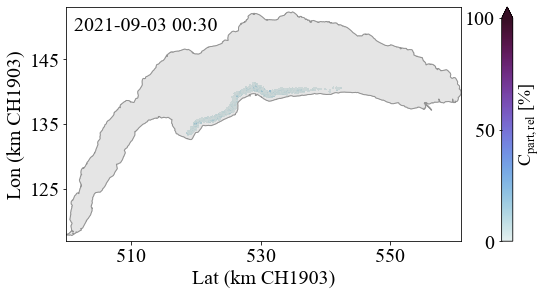

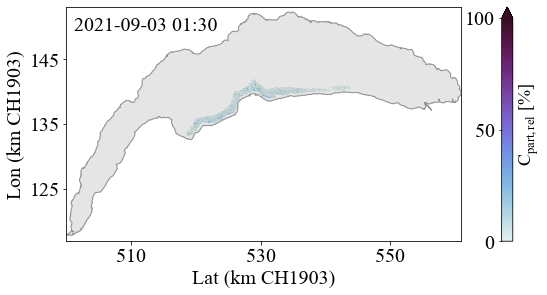

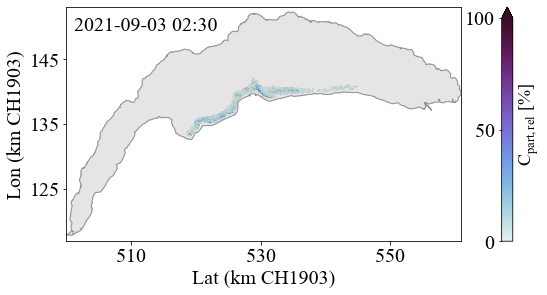

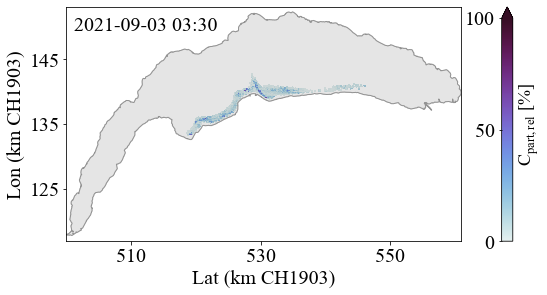

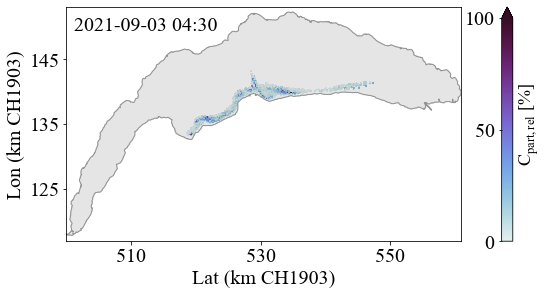

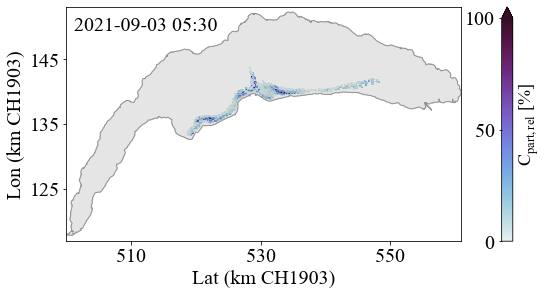

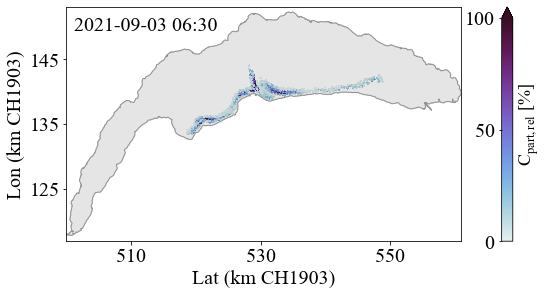

KeyboardInterrupt: 

In [23]:
plt_path = 'E:/ALPLakes/conferences/surf_day2022/plots/'

qq = 1
###############
ii=1
tr = data.sel(pid=qq, drop=True)
time_plt = time.where(tr.itrack < 1e6, drop=True)
xp = np.array(tr.xtrack[:qq])
yp = np.array(tr.xtrack[:qq])
zp_orig = np.array(tr.ztrack[qq])
part_no_prob, _, _ = np.histogram2d(xp, yp, bins=[xg_plt[0,:],yg_plt[:,0]])
part_no_prob = part_no_prob.T
part_no_prob[:,:] = 0


for qq in range(len(time_plt)-2):
    for zd in zdata:
        # now = zd.sel(time=np.datetime64(cutoff_date), drop=True)
        now = zd.sel(time=time_plt[qq], drop=True)
        xp = (now.xtrack).to_masked_array().filled()
        xp[xp > 1e9] = np.nan
        yp = now.ytrack.to_masked_array().filled()
        yp[yp > 1e9] = np.nan
        zp = now.ztrack.to_masked_array().filled()
        zp[zp > 310] = np.nan
    xp_tot = xp.copy()
    yp_tot = yp.copy()
    zp_tot = zp.copy()


    ###############
    if (qq<24):
        for ii in range(5,6):
            data_file = join(data_dir, "PT13_forward_south_%d_run.nc" %ii)
            inout_file = join(data_dir, "PT13_forward_south_%d_inout.nc" %ii)

            xp,yp,zp = open_pt_output(data_file,inout_file,time_plt[qq])

            xp_tot = np.concatenate((xp_tot,xp))
            yp_tot = np.concatenate((yp_tot,yp))
            zp_tot = np.concatenate((zp_tot,zp))
    else:
        for ii in range(2,6):
            data_file = join(data_dir, "PT13_forward_south_%d_run.nc" %ii)
            inout_file = join(data_dir, "PT13_forward_south_%d_inout.nc" %ii)

            xp,yp,zp = open_pt_output(data_file,inout_file,time_plt[qq])

            xp_tot = np.concatenate((xp_tot,xp))
            yp_tot = np.concatenate((yp_tot,yp))
            zp_tot = np.concatenate((zp_tot,zp))

    data_dir = "G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT_secchi_low/PT13_forward_south/"
    fname = "PT13_forward_south"
    # fname = "PT_test"
    # data_dir = "E:/ALPLakes/Codes/Ctracker/config_for_cscs/PT3_backward_west/"
    # fname = "PT3_backward_3depths"
    data_file = join(data_dir, "%s_run.nc" % fname)
    inout_file = join(data_dir, "%s_inout.nc" % fname)
    xp,yp,zp = open_pt_output(data_file,inout_file,time_plt[qq])

    xp_tot = np.concatenate((xp_tot,xp))
    yp_tot = np.concatenate((yp_tot,yp))
    zp_tot = np.concatenate((zp_tot,zp))

    data_dir = "G:/ALPLakes/algal_bloom_Sep2021/Particle_tracking/PT_secchi_low/PT13_forward_south/100PT"
    fname = "PT13_forward_south"
    ###############
    for ii in range(8,9):
        data_file = join(data_dir, "PT13_forward_south_%d_run.nc" %ii)
        inout_file = join(data_dir, "PT13_forward_south_%d_inout.nc" %ii)

        xp,yp,zp = open_pt_output(data_file,inout_file,time_plt[qq])

        xp_tot = np.concatenate((xp_tot,xp))
        yp_tot = np.concatenate((yp_tot,yp))
        zp_tot = np.concatenate((zp_tot,zp))


    ##############
    fig_size = (8,8.5)
    font_feature = ['Times New Roman', 20, 20] # [fontname, fontsize_labels, fontsize_ticks]
    ###############   
    part_no_snap, _, _ = np.histogram2d(xp_tot, yp_tot, bins=[xg_plt[0,:],yg_plt[:,0]])
    part_no_snap = part_no_snap.T
    #     part_no_snap[part_no_snap<2] = np.nan
    min_val = 1 #np.nanquantile(part_no_snap,0.2)
    part_no_snap[part_no_snap<min_val] = np.nan
    # max_val = np.nanquantile(part_no_snap,0.8)

    ############### 
    part_depth_snap = part_no_snap.copy()
    part_depth_snap[:,:] = 0

    for ii in range(len(xp_tot)):
        if ((~np.isnan(xp_tot[ii])) & (~np.isnan(yp_tot[ii]))):
            ind_x = np.searchsorted(0.5*(xg_plt[0,:-1]+xg_plt[0,1:]),xp_tot[ii])
            ind_y = np.searchsorted(0.5*(yg_plt[:-1,0]+yg_plt[1:,0]),yp_tot[ii])
            if (~np.isnan(zp_tot[ii])):
                part_depth_snap[ind_y,ind_x] = part_depth_snap[ind_y,ind_x]+np.exp(-2*0.4097*zp_tot[ii])

    #     part_depth_snap = part_depth_snap/part_no_snap
    #     part_depth_snap[part_depth_snap>60] = np.nan
    part_depth_snap[part_depth_snap<0.01] = np.nan


    f = plt.figure(figsize=fig_size)

    ax2 = f.add_subplot(111)
    SS1 = plt.fill(xs,ys,color='k',alpha=0.1)
    plt.hold = True
    SS = plt.pcolormesh(xp_conv[:-1,:-1],yp_conv[:-1,:-1],100*part_depth_snap/2.1, vmin=0,vmax=100, cmap=cmocean.cm.dense,shading='flat')
    plt.hold=True
    ax2.plot(xs,ys, color='#939393', lw=1.)

    plt.xticks(fontname=font_feature[0],fontsize=font_feature[2])
    plt.yticks(fontname=font_feature[0],fontsize=font_feature[2])

    ax2.set_xticks([510,530,550])
    ax2.set_yticks([125,135,145])

    ax2.set_xlim(500, 561)
    ax2.set_ylim(117, 153)
    ax2.set_aspect('equal')
#     ax2.set_xlabel("Lat (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
#     ax2.set_ylabel("Lon (km CH1903)",fontname=font_feature[0],fontsize=font_feature[1])
#     ax2.annotate(str(time_plt[qq].values.astype("datetime64[m]")).replace("T", " "),xy=(0.02, 0.9), xycoords='axes fraction',fontname=font_feature[0],fontsize=font_feature[1])

#     plt.savefig(plt_path+str(qq).zfill(3)+'_'+str(time_plt[qq].values.astype("datetime64[m]")).replace("T", " ")[0:10]+'H'+str(time[qq].values.astype("datetime64[m]")).replace("T", " ")[11:13]+'.png',dpi=300, bbox_inches = 'tight')

    plt.show()
    plt.close()


# old plots

In [222]:
min_v = 1
max_v = 20
cm = "viridis_r"

cm = plt.get_cmap(cm)
cNorm  = Normalize(vmin=min_v, vmax=max_v)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=cm)

# we must generate a colorbar
CS3 = plt.contourf(np.linspace(min_v, max_v, 100).reshape(10,10),
                   levels=np.arange(min_v, max_v+0.1, 0.2), cmap=cm,
                   extend="max")
plt.clf()

<Figure size 432x288 with 0 Axes>

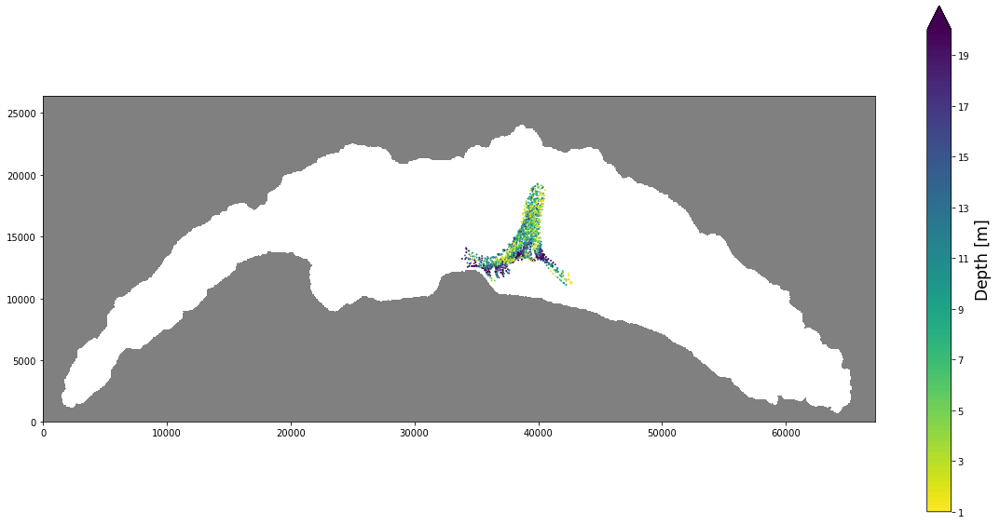

In [226]:
cutoff_date = '2021-09-05T18:30:00.000000000'


fig = plt.figure(figsize=(20, 10))

ax = fig.add_subplot(111)
ax.set_aspect("equal")
ax.pcolormesh(xG, yG, bathy,
              shading="flat", edgecolors='None',
              cmap="gray", vmin=-0.05, vmax=0.05, zorder=1)

for ii in sel_pid[5::500]:
    tr = data.sel(pid=ii, drop=True)
    time_plt = time.where(tr.itrack < 1e6, drop=True)
    ind_cutoff = np.where(np.array(time_plt)==np.datetime64(cutoff_date))[0]
    if (len(ind_cutoff)>0):
        ind_cutoff = ind_cutoff[0]
        tr = tr.where(tr.itrack < 1e6, drop=True)
        zp = tr.ztrack
        zp[zp > 310] = np.nan

        ax.scatter(tr.xtrack[:ind_cutoff],
                       tr.ytrack[:ind_cutoff],
                       c=zp[:ind_cutoff], marker='o', s=1,
                       cmap=cm)
    
clb = plt.colorbar(CS3)
clb.set_label(r"Depth $\mathrm{[m]}$", fontsize="xx-large")
plt.show()

# Particles snapshot

NameError: name 'cm' is not defined

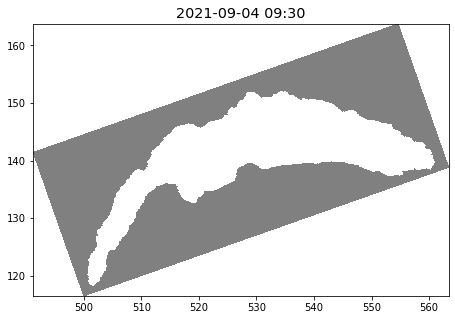

In [14]:
tt = time[49]


fig = plt.figure(figsize=(10, 5))

ax = fig.add_subplot(111)
ax.set_aspect("equal")
ax.set_title(str(tt.values.astype("datetime64[m]")).replace("T", " "),
             fontsize="x-large")

ax.pcolormesh(1e-3*xG_conv, 1e-3*yG_conv, bathy,
              shading="flat", edgecolors='None',
              cmap="gray", vmin=-0.05, vmax=0.05, zorder=1)

# ax.plot(xend, yend, 'k:', lw=2)

#Load alive tracks at that time
for zd in zdata:
    now = zd.sel(time=tt, drop=True)

    # compute age and convert it to days
    #age = (tt.values - inout.t_ini).astype(float) / 86400.e9
    #max_v = max(np.round(np.percentile(age[age>0], 95) / 10) * 10, 1)

    xp = (now.xtrack).to_masked_array().filled()
    xp[xp > 1e9] = np.nan
    yp = now.ytrack
    xp_conv = (np.cos(gridAngle)*xp - np.sin(gridAngle)*yp) + X0
    yp_conv = (np.sin(gridAngle)*xp + np.cos(gridAngle)*yp) + Y0
    zp = now.ztrack
    zp[zp > 310] = np.nan
    ax.scatter(1e-3*xp_conv, 1e-3*yp_conv,
               c=zp,
                   cmap=cm, vmin=min_v, vmax=max_v, marker=',')

clb = plt.colorbar(CS3)
clb.set_label(r"Depth $\mathrm{[m]}$", fontsize="xx-large")


ax.set_xlabel(r"East $\mathrm{[km]}$")
ax.set_ylabel(r"North $\mathrm{[km]}$")
# ax.set_xlim(510, 528)
# ax.set_ylim(130, 145)

# # axi = fig.add_axes([0.46, 0.16, 0.22, 0.4], fc="none")
# axi.set_title("Mean wind vector", fontsize="medium")
# axi.set_xticks([])
# axi.set_yticks([])

plt.show()
plt.close()